In [46]:
%load_ext autoreload
%autoreload 2
import warnings
import numpy as np
import time
import os
from dotenv import load_dotenv
os.environ["USE_PYGEOS"] = "0"
import napari_sparrow as nas
from spatialdata import read_zarr
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from random import sample 
import scanpy as sc
import seaborn as sns
import anndata as ad
%run own_and_modified_functions.ipynb
warnings.simplefilter(action='ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
OUTPUT_DIR = '/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data'
sdata = read_zarr( os.path.join(  OUTPUT_DIR, 'sdata.zarr'  ) )
anndata = sc.read('/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/anndataNucA11') # reset original anndata
# delete anndata
del sdata.table
# create anndata
sdata.table = anndata

In [3]:
n_pca = np.count_nonzero(sdata.table.uns['pca']['variance_ratio'] > 0.01)
make_umap(sdata,n_PCAs=n_pca,n_neighbors=15) # umap only used for the visualization, does not have an effect on the annotation with 'score_genes'

In [4]:
path_mg = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm.csv"

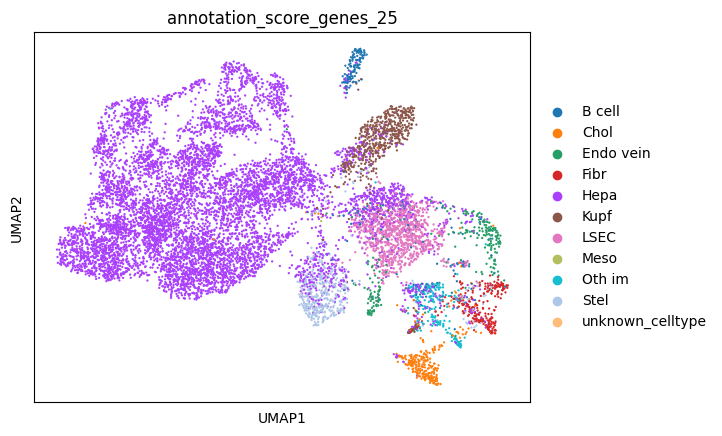

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
                  annotation_score_genes_25
B cell                             2.235483
Chol                               2.431421
Endo vein                          2.253295
Fibr                               2.190951
Hepa                              70.876380
Kupf                               5.343783
LSEC                               9.120057
Meso                               0.062344
Oth im                             1.710011
Stel                               3.767367
unknown_celltype                   0.008906


In [5]:
# Original score_genes
mg_dict, scoresper_cluster = score_genes_bins(
    sdata = sdata,
    path_marker_genes = path_mg,
    bins = 25)
visualize_classification(sdata,'annotation_score_genes_25','umap_23_15',"/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm.csv",plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

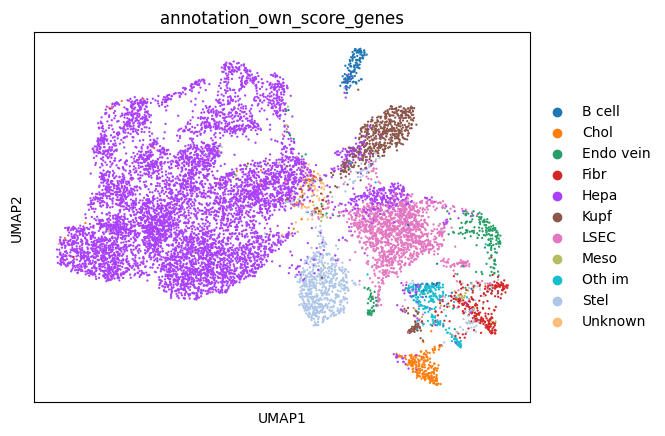

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes
B cell                       1.531885
Chol                         2.280014
Endo vein                    2.021731
Fibr                         2.440328
Hepa                        64.205558
Kupf                         5.664410
LSEC                        12.602423
Meso                         0.400784
Oth im                       1.950481
Stel                         6.296758
Unknown                      0.605629


,Hepa,LSEC,Endo vein,Chol,Kupf,Stel,Fibr,B cell,Meso,Oth im
0,0.518377,0.006058,0.030701,0.085765,0.021587,NaN,0.034497,NaN,NaN,0.038485
1,NaN,0.077458,0.003792,NaN,0.373149,NaN,0.231369,NaN,0.492883,NaN
2,NaN,NaN,0.001595,NaN,0.023841,NaN,0.232491,NaN,0.672062,NaN
3,0.195218,NaN,NaN,0.036456,NaN,NaN,0.122768,NaN,0.214938,NaN
4,0.248247,NaN,NaN,0.069145,NaN,0.052458,0.032160,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
11223,0.322433,NaN,NaN,0.059235,NaN,0.054651,0.029201,NaN,NaN,NaN
11224,0.516080,NaN,NaN,0.081015,0.065312,0.067269,0.041674,NaN,NaN,NaN
11225,0.348373,0.007146,NaN,0.058203,0.049473,NaN,NaN,NaN,NaN,NaN
11226,NaN,0.072516,NaN,NaN,0.062516,0.628982,0.337339,NaN,NaN,NaN


In [6]:
# Own score genes, just the MinMax scaling
scores = own_score_genes(sdata.table,path_mg)
visualize_classification(sdata,'annotation_own_score_genes','umap_23_15',path_mg,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)
scores

Hepa         0.642056
LSEC         0.126024
Stel         0.062968
Kupf         0.056644
Fibr         0.024403
Chol         0.022800
Endo vein    0.020217
Oth im       0.019505
B cell       0.015319
Unknown      0.006056
Meso         0.004008
Name: annotation_own_score_genes, dtype: float64


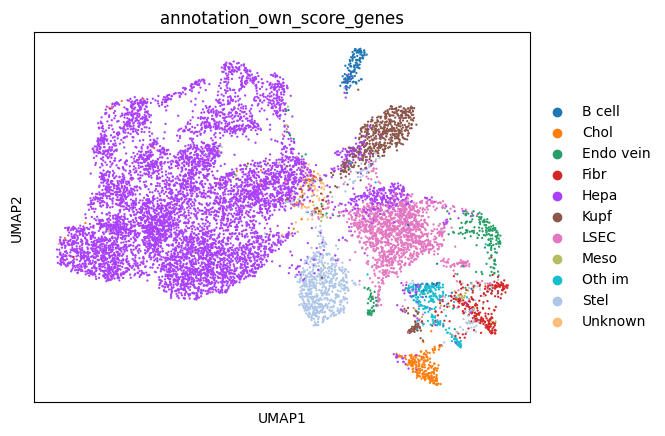

number of cells of each cell type to calculate the mean expression in this iteration: 45


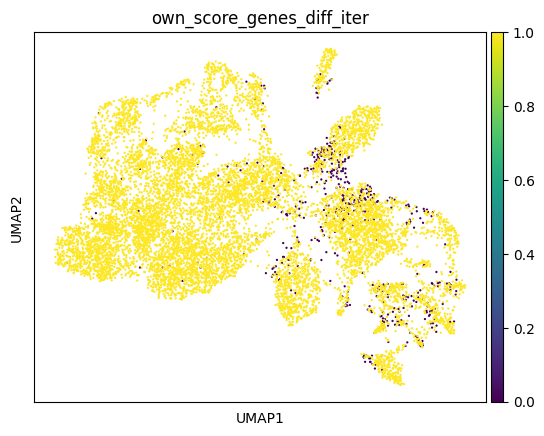

0.051389383683648024


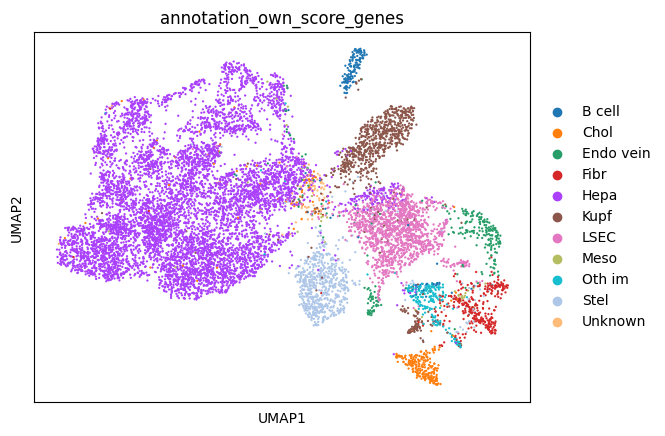

Hepa         0.615069
LSEC         0.126737
Kupf         0.074368
Stel         0.058782
Fibr         0.028678
Chol         0.026808
Endo vein    0.024225
Oth im       0.018792
B cell       0.016744
Unknown      0.006056
Meso         0.003741
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 42


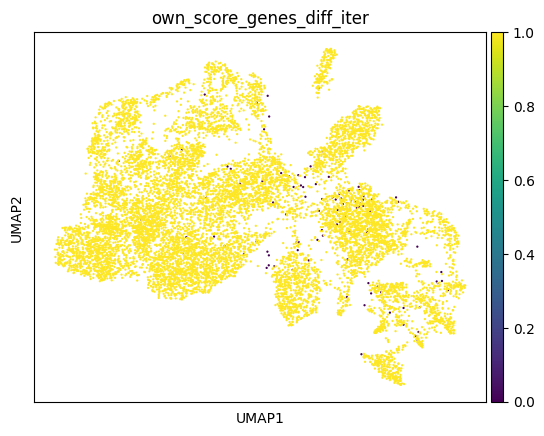

0.00952974706091913


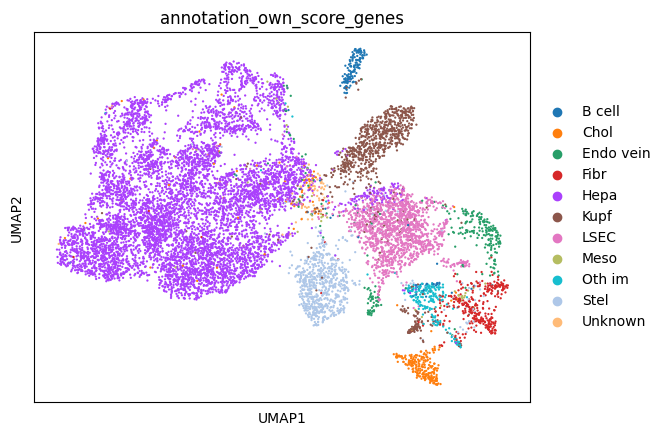

Hepa         0.609726
LSEC         0.126915
Kupf         0.076861
Stel         0.059939
Fibr         0.029925
Chol         0.027075
Endo vein    0.024403
Oth im       0.018258
B cell       0.016566
Unknown      0.006056
Meso         0.004275
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 48


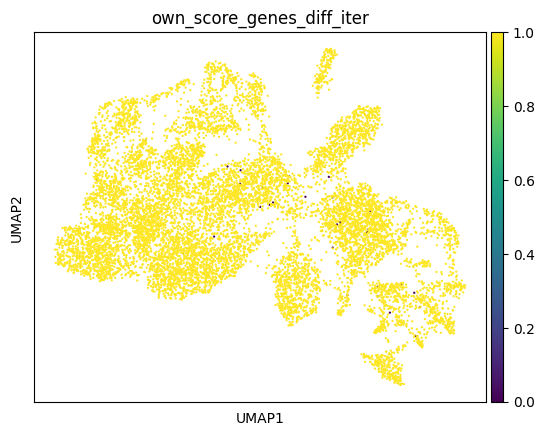

0.003028143925899537


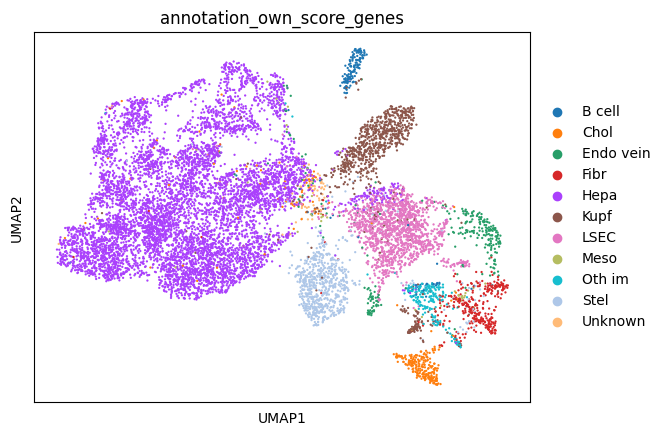

Hepa         0.609548
LSEC         0.127093
Kupf         0.075436
Stel         0.060029
Fibr         0.030014
Chol         0.028144
Endo vein    0.024760
Oth im       0.018614
B cell       0.016299
Unknown      0.006056
Meso         0.004008
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 45


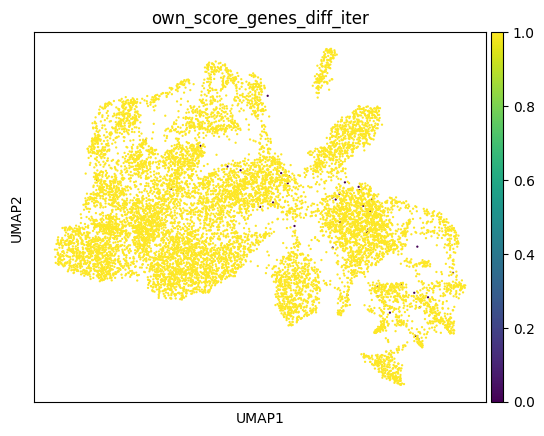

0.003651585322408265


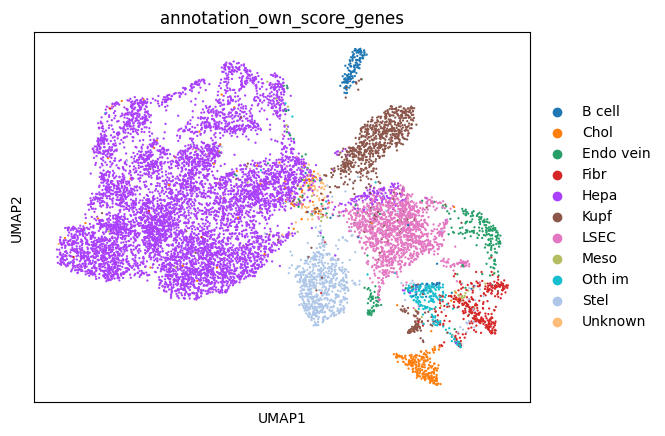

Hepa         0.610171
LSEC         0.126470
Kupf         0.076327
Stel         0.060385
Fibr         0.030192
Chol         0.027431
Endo vein    0.023780
Oth im       0.018169
B cell       0.016655
Unknown      0.006056
Meso         0.004364
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 49


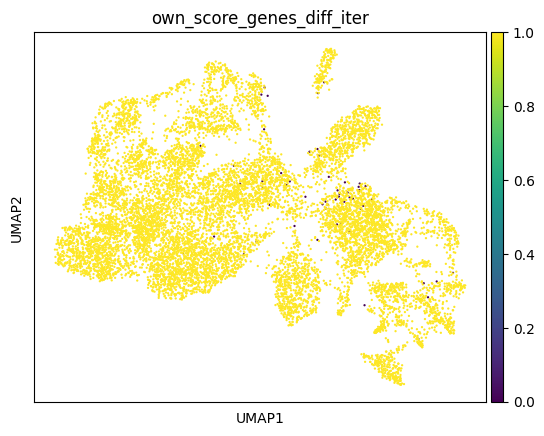

0.005076594228713929


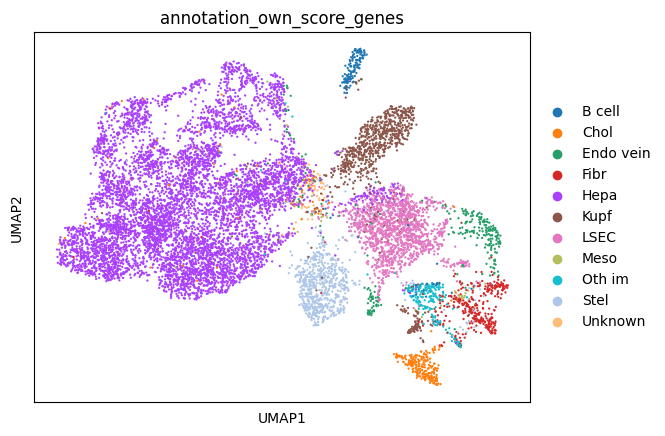

Hepa         0.607855
LSEC         0.128696
Kupf         0.077663
Stel         0.059672
Fibr         0.029836
Chol         0.026719
Endo vein    0.024581
Oth im       0.018436
B cell       0.016388
Unknown      0.006056
Meso         0.004097
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 46


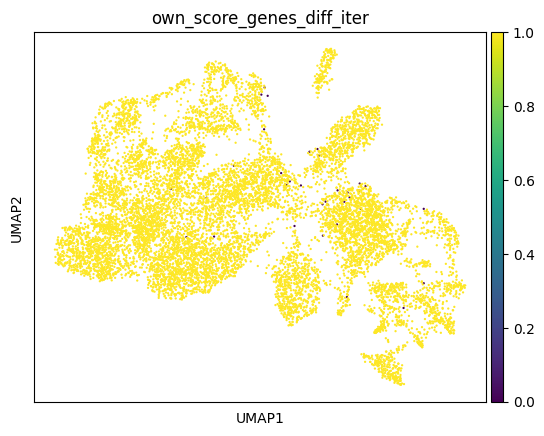

0.003028143925899537


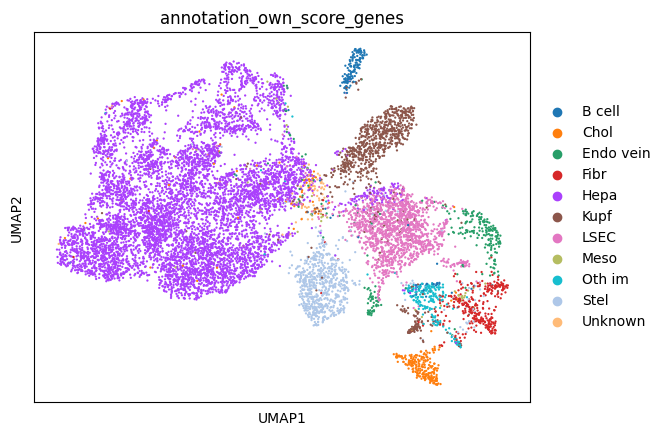

Hepa         0.609993
LSEC         0.128162
Kupf         0.076950
Stel         0.059583
Fibr         0.029658
Chol         0.026630
Endo vein    0.023869
Oth im       0.018525
B cell       0.016388
Unknown      0.006056
Meso         0.004186
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 47


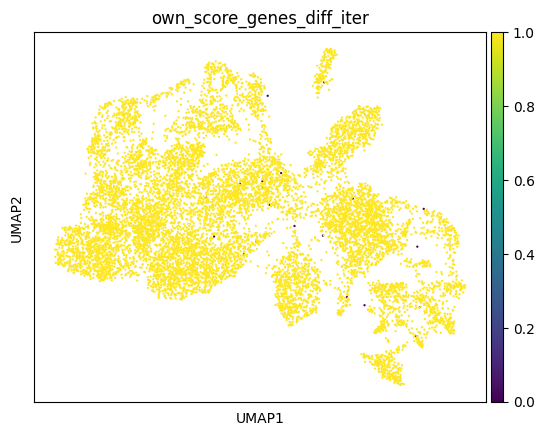

0.0017812611328820805


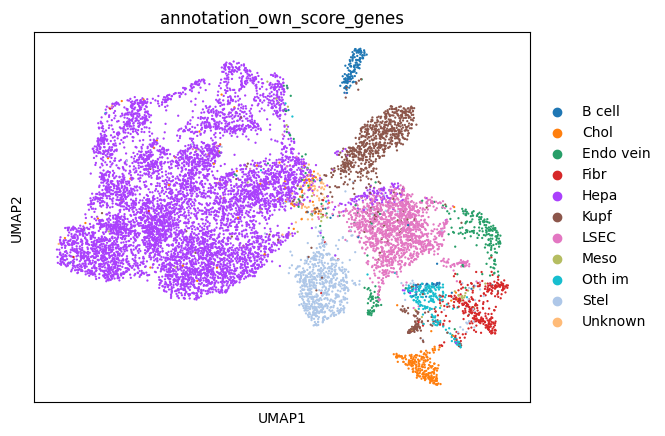

Hepa         0.609637
LSEC         0.127538
Kupf         0.076594
Stel         0.059583
Fibr         0.029658
Chol         0.027431
Endo vein    0.024492
Oth im       0.018347
B cell       0.016477
Unknown      0.006056
Meso         0.004186
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 47


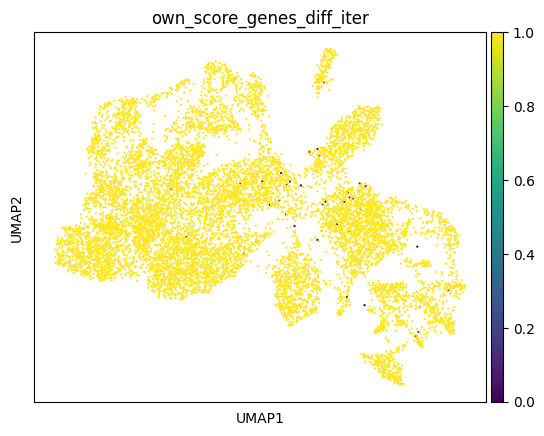

0.003651585322408265


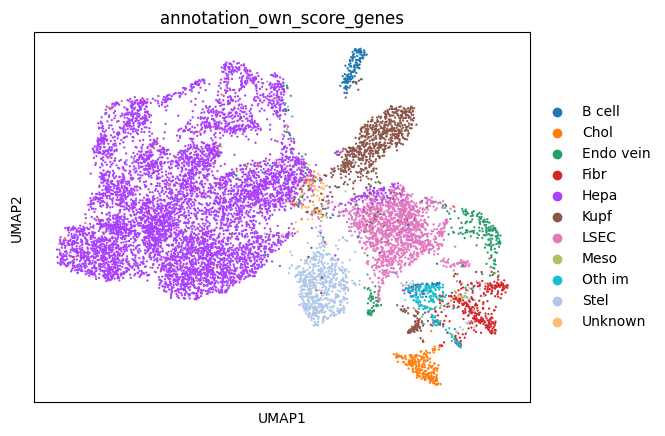

Hepa         0.608033
LSEC         0.128696
Kupf         0.077485
Stel         0.060385
Fibr         0.029480
Chol         0.026719
Endo vein    0.024047
Oth im       0.018525
B cell       0.016477
Unknown      0.006056
Meso         0.004097
Name: annotation_own_score_genes, dtype: float64


[0.051389383683648024,
 0.00952974706091913,
 0.003028143925899537,
 0.003651585322408265,
 0.005076594228713929,
 0.003028143925899537,
 0.0017812611328820805,
 0.003651585322408265]

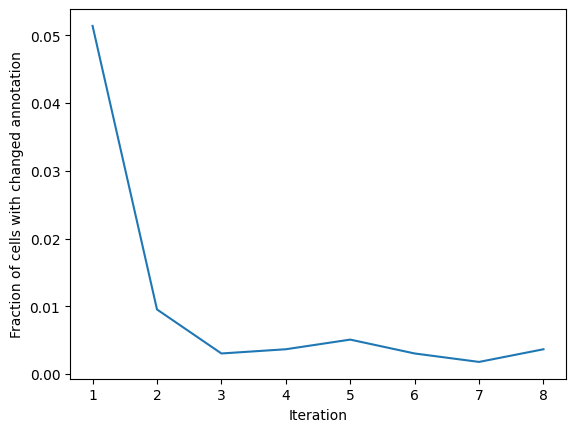

In [7]:
# Own score genes iterative
own_score_genes_iterative(sdata.table,path_mg,nr_iterations=8)

In [8]:
sdata.table.obs.columns

Index(['region', 'instance', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes',
       'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize',
       'annotation_score_genes_25', 'cleanliness_score_genes_25',
       'score_celltype_own_score_genes',
       'second_score_celltype_own_score_genes', 'cleanliness_own_score_genes',
       'own_score_genes_diff_iter', 'annotation_own_score_genes_previous',
       'annotation_own_score_genes'],
      dtype='object')

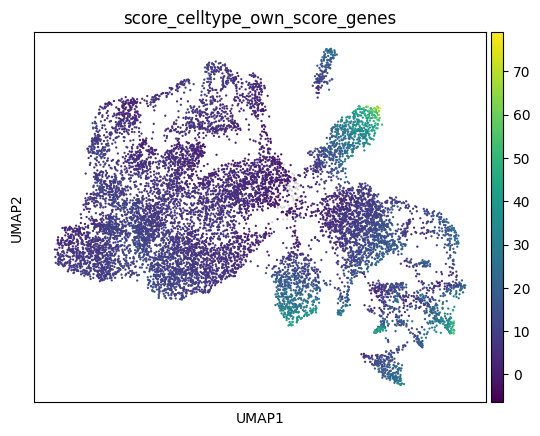

In [9]:
sc.pl.umap(sdata.table,color=['score_celltype_own_score_genes'])

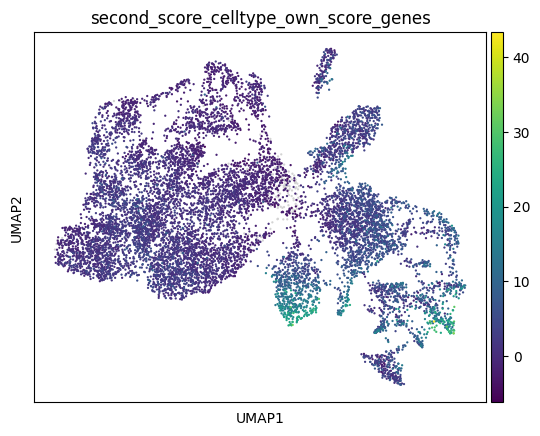

In [10]:
sc.pl.umap(sdata.table,color=['second_score_celltype_own_score_genes'])

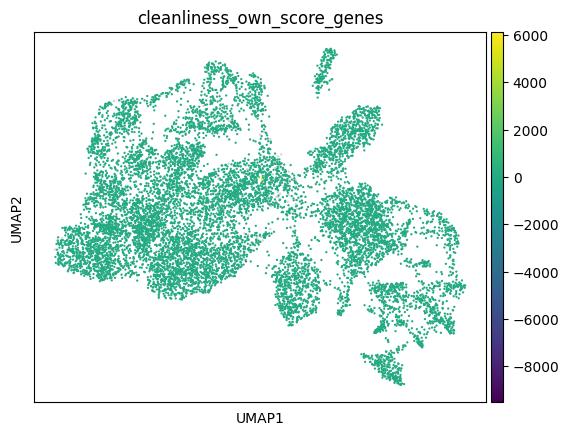

In [11]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes'])

Hepa          8.669
LSEC          9.333
Endo vein     7.250
Chol          7.500
Kupf         19.500
Stel         16.001
Fibr         17.625
B cell        4.500
Meso          6.000
Oth im        4.000
dtype: float64


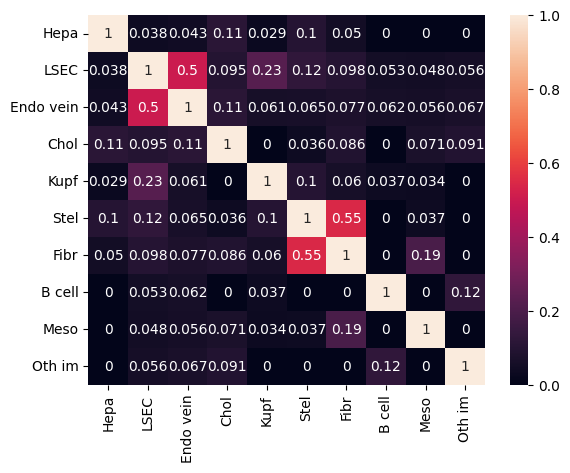

In [12]:
Jaccard_similarity_matrix(path_mg)

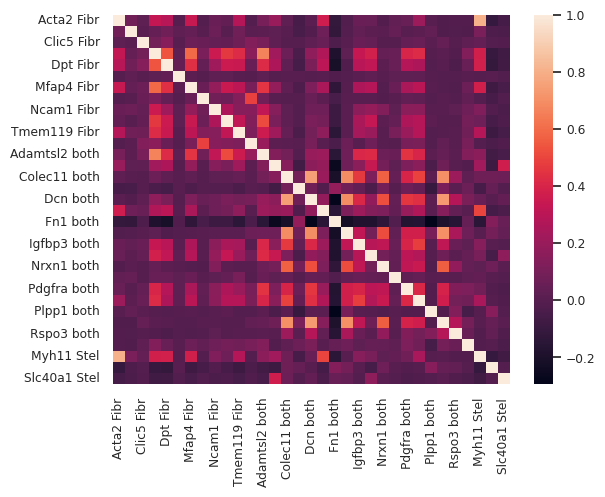

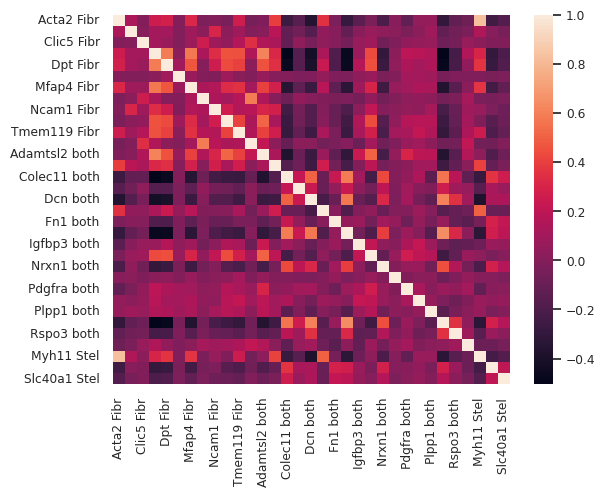

In [13]:
# plot correlation matrix of the gene expression of the marker genes of 2 confused cell types
# confusion between fibroblasts and stellate cells
# expression of all cells
sns.set(font_scale=0.8)
correlation_matrix_expression_marker_genes_of_2_cell_types(sdata.table,path_mg,'Fibr','Stel')
plt.show()
# expression of cells that are classified as fibroblasts or stellate cells
adata_sub = sdata.table[(sdata.table.obs['annotation_own_score_genes'] == 'Fibr') | (sdata.table.obs['annotation_own_score_genes'] == 'Stel'),:]
correlation_matrix_expression_marker_genes_of_2_cell_types(adata_sub,path_mg,'Fibr','Stel')

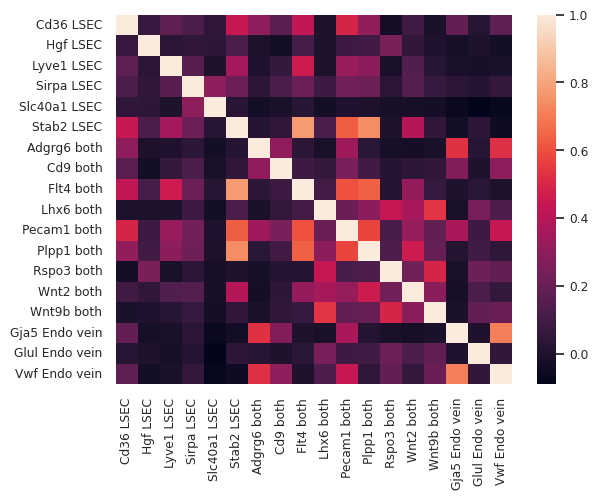

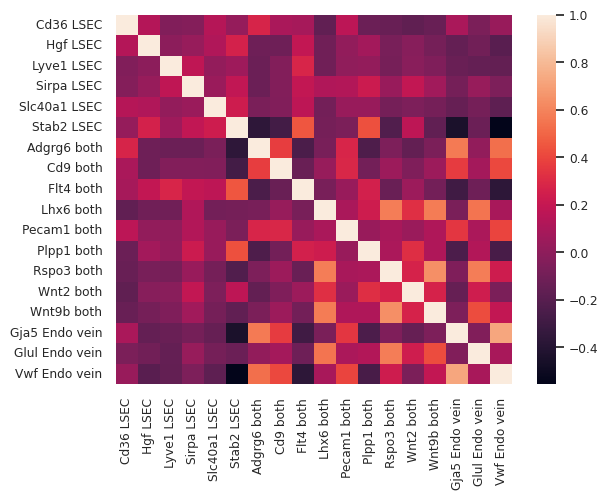

In [14]:
# plot correlation matrix of the gene expression of the marker genes of 2 confused cell types
# confusion between LSECs and Endo vein cells
# expression of all cells
correlation_matrix_expression_marker_genes_of_2_cell_types(sdata.table,path_mg,'LSEC','Endo vein')
plt.show()
# expression of cells that are classified as fibroblasts or stellate cells
adata_sub = sdata.table[(sdata.table.obs['annotation_own_score_genes'] == 'LSEC') | (sdata.table.obs['annotation_own_score_genes'] == 'Endo vein'),:]
correlation_matrix_expression_marker_genes_of_2_cell_types(adata_sub,path_mg,'LSEC','Endo vein')

<AxesSubplot: >

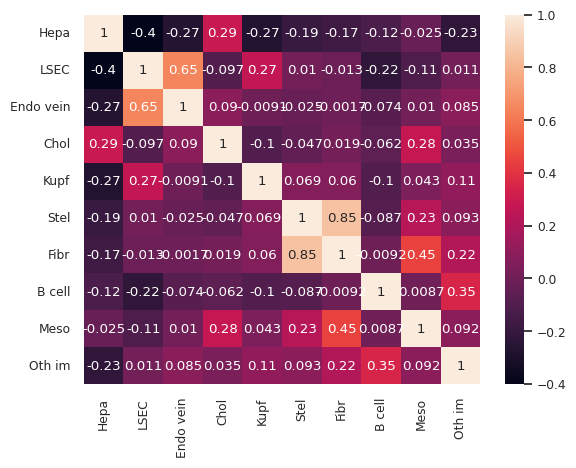

In [15]:
# plot correlation matrix of the features
sns.heatmap(scores.corr(method='pearson'), annot=True)
# sns.heatmap(scores_minmax.corr(method='pearson'), annot=True) gives the same heatmap

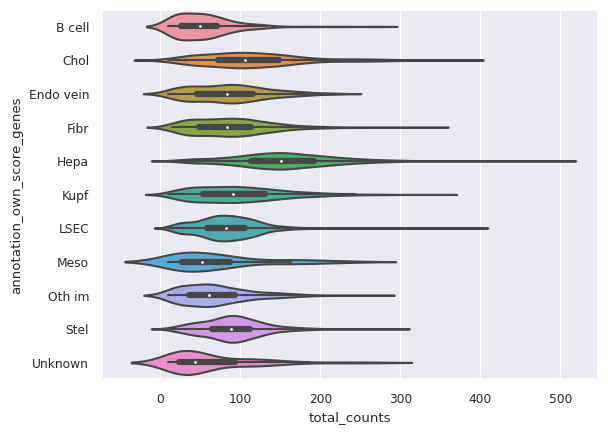

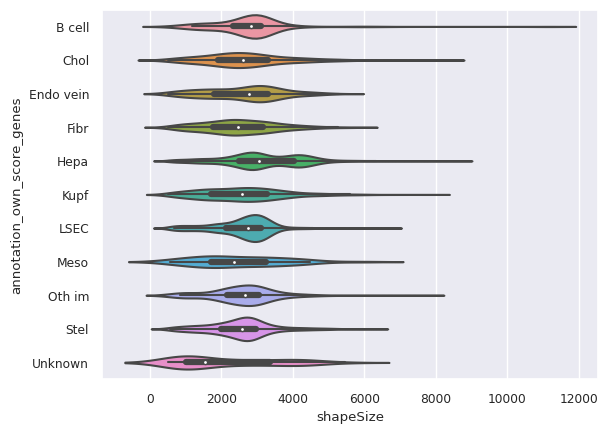

<AxesSubplot: xlabel='count_density', ylabel='annotation_own_score_genes'>

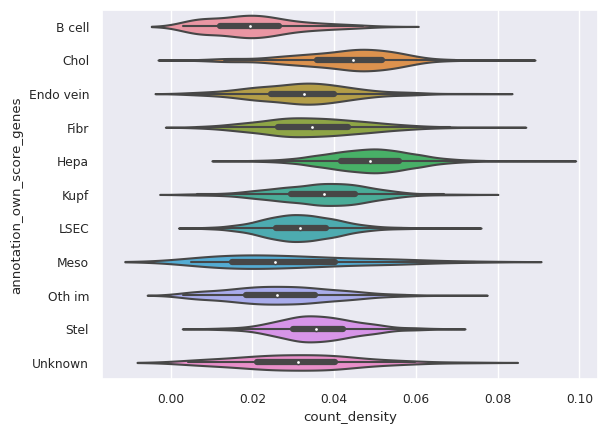

In [16]:
sns.violinplot(data=sdata.table.obs,x="total_counts",y="annotation_own_score_genes")
plt.show()
sns.violinplot(data=sdata.table.obs,x="shapeSize",y="annotation_own_score_genes")
plt.show()
sdata.table.obs['count_density'] = sdata.table.obs['total_counts'] / sdata.table.obs['shapeSize']
sns.violinplot(data=sdata.table.obs,x="count_density",y="annotation_own_score_genes")

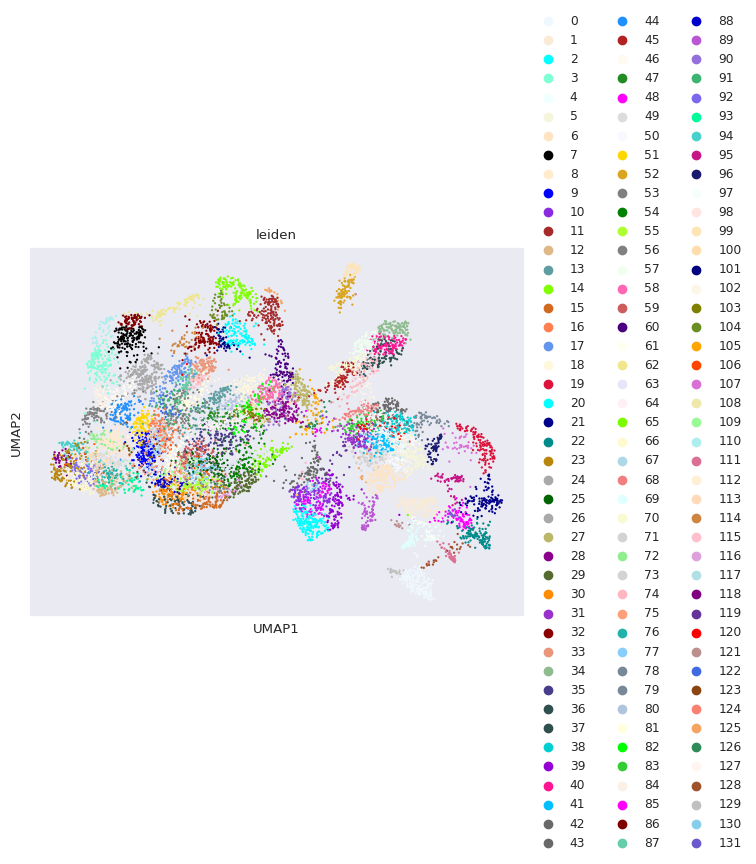

In [17]:
sc.tl.leiden(sdata.table,resolution=10,key_added='leiden')
sc.pl.umap(sdata.table,color='leiden',palette=list(matplotlib.colors.CSS4_COLORS.values()))

Index(['B cell', 'Chol', 'Endo vein', 'Fibr', 'Hepa', 'Kupf', 'LSEC', 'Meso',
       'Oth im', 'Stel', 'Unknown'],
      dtype='object')
Hepa
[3, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 35, 36, 44, 46, 47, 49, 51, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 72, 73, 75, 76, 77, 79, 80, 81, 82, 84, 86, 87, 88, 90, 91, 92, 93, 94, 98, 100, 101, 103, 104, 106, 108, 109, 110, 113, 114, 115, 116, 118, 122, 123, 124, 127]
Kupf
[34, 37, 40, 45, 57, 69, 70, 74, 102, 121]
LSEC
[4, 5, 6, 31, 38, 41, 43, 50, 71, 78, 83, 95, 96, 112, 117, 120]
Endo vein
[19, 89, 107]
Fibr
[21, 22, 48, 131]
Stel
[2, 10, 39, 42, 85, 119, 130]
Meso
[]
Chol
[0, 129]
B cell
[52, 99]
Oth im
[1, 97, 111]
Unknown
[105, 125, 126, 128]


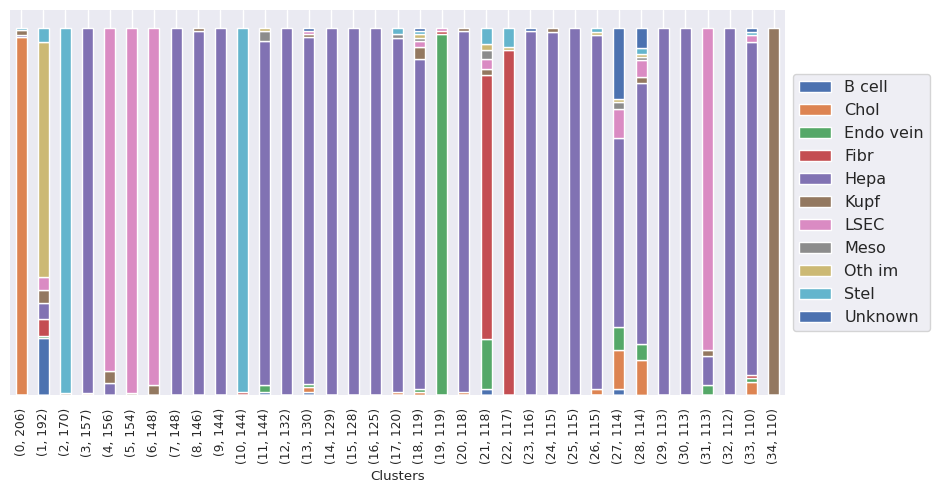

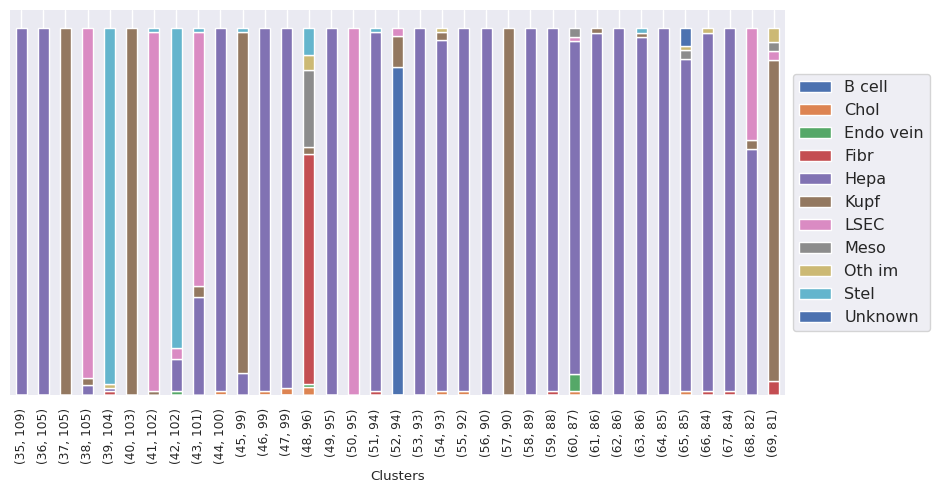

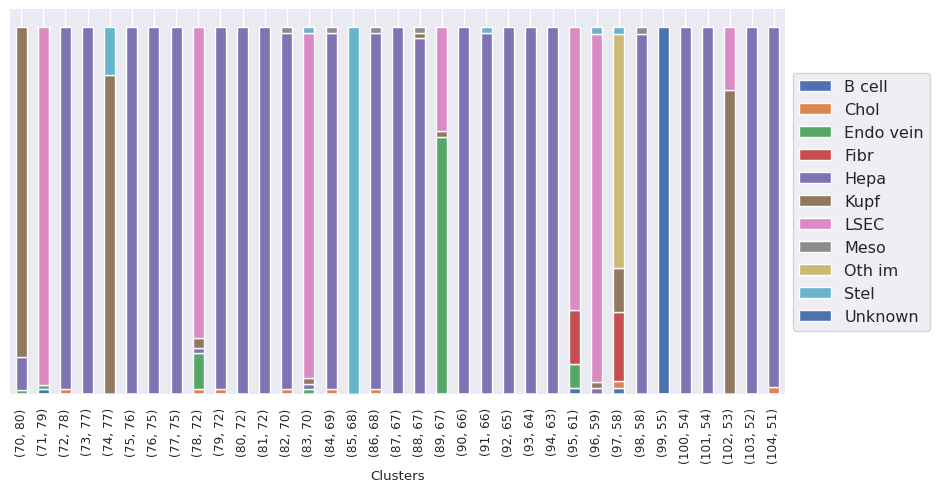

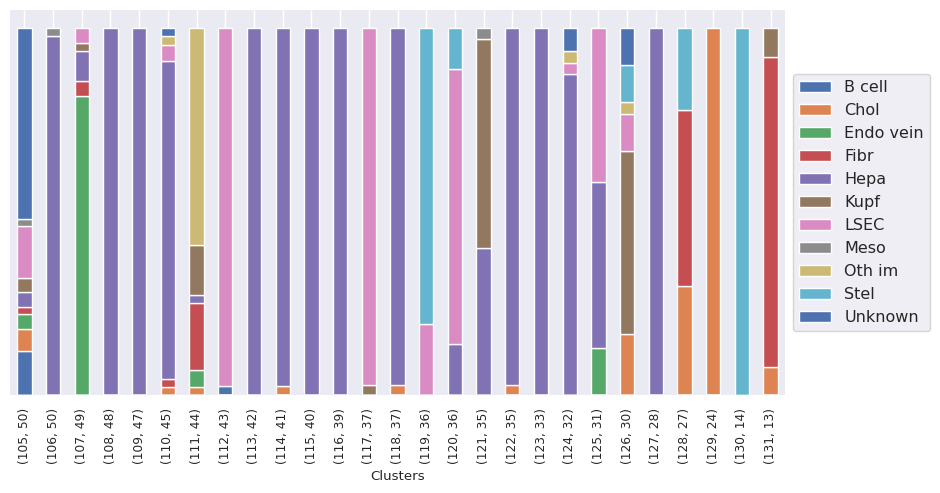

In [18]:
cell_types = ['Hepa','Kupf','LSEC','Endo vein','Fibr','Stel','Meso','Chol','B cell','Oth im','Unknown']
leiden_clusters_per_ct = clusteringVSleiden(sdata.table, "annotation_own_score_genes", "leiden",cell_types)

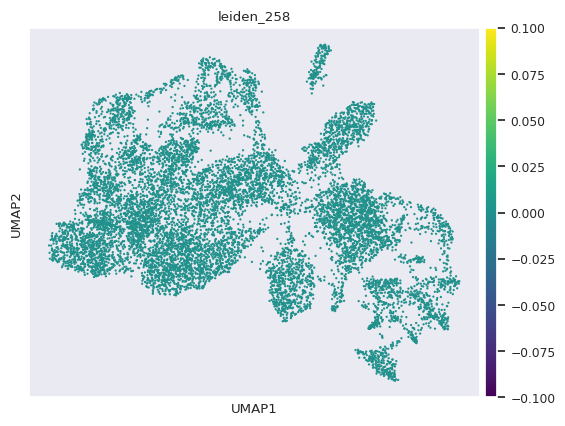

In [19]:
sdata.table.obs['leiden_258'] = (sdata.table.obs['leiden'] == '258').astype(int)
sc.pl.umap(sdata.table,color=['leiden_258'],color_map='viridis')

In [20]:
a = sdata.table.obs['leiden']
i = 0
for putative_leiden_clusters in leiden_clusters_per_ct:
    L = [str(x) for x in putative_leiden_clusters]
    for n in L:
        a = a.replace(n,cell_types[i])
    i += 1
sdata.table.obs['leiden_cell_types'] = a
# cells per leiden_cell_type cluster, to see the max number of n_cells you can take per cluster (149 in this case)
print(sdata.table.obs['leiden_cell_types'].value_counts())
min_cells_per_leiden_cell_type = sdata.table.obs['leiden_cell_types'].value_counts().min()
print(min_cells_per_leiden_cell_type)

Hepa         6936
LSEC         1431
Kupf          833
Stel          638
Fibr          344
Oth im        294
Endo vein     235
Chol          230
B cell        149
Unknown       138
Name: leiden_cell_types, dtype: int64
138


149
Summary:
Hepa
Maybe drop:[['Glul', 'Endo vein']]
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Cxcl12', 'Hepa'], ['Plpp1', 'Endo vein'], ['Fn1', 'Stel'], ['Fn1', 'Chol']]
Stel
Maybe drop:[['Fn1', 'Hepa'], ['Plpp1', 'Endo vein'], ['Axl', 'Fibr'], ['Lpl', 'Fibr'], ['Plpp1', 'Fibr']]
Chol
Maybe drop:[['Fn1', 'Hepa']]
Kupf
Maybe drop:[['Cd36', 'LSEC'], ['Plpp1', 'Endo vein'], ['Pecam1', 'B cell']]
LSEC
Maybe drop:[['Adgrg6', 'Endo vein'], ['Adgrg6', 'Chol']]
Oth im
Maybe drop:[['Cd9', 'Endo vein'], ['Cd9', 'Chol']]
Summary:
Hepa
Maybe drop:[['Glul', 'Endo vein']]
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Cxcl12', 'Hepa'], ['Plpp1', 'Endo vein'], ['Fn1', 'Stel'], ['Fn1', 'Chol']]
Stel
Maybe drop:[['Fn1', 'Hepa'], ['Plpp1', 'Endo vein'], ['Axl', 'Fibr'], ['Lpl', 'Fibr'], ['Des', 'Fibr']]
Kupf
Maybe drop:[['Cd36', 'LSEC'], ['Plpp1', 'Endo vein'], ['Pecam1', 'B cell']]
LSEC
Maybe drop:[['Adgrg6', 'Endo vein'], ['Adgrg6', 'Chol']]
Oth im
Maybe drop:[['Cd9', 'Endo vein'], ['Cd9', 'Chol']]
Summary:
Hepa
Mayb

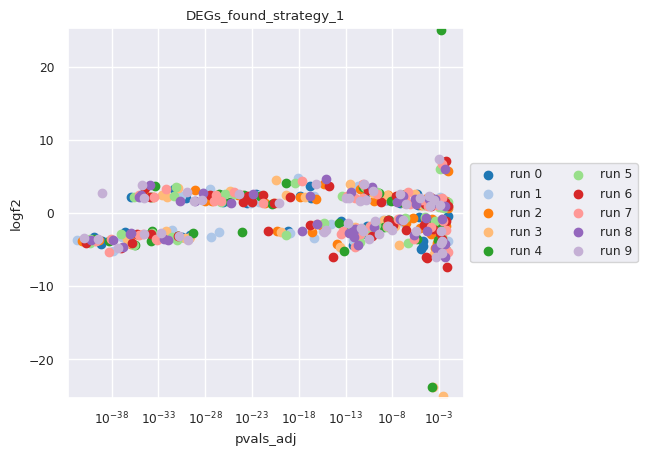

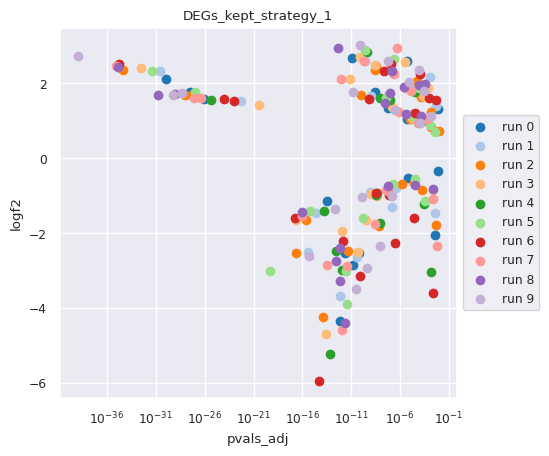

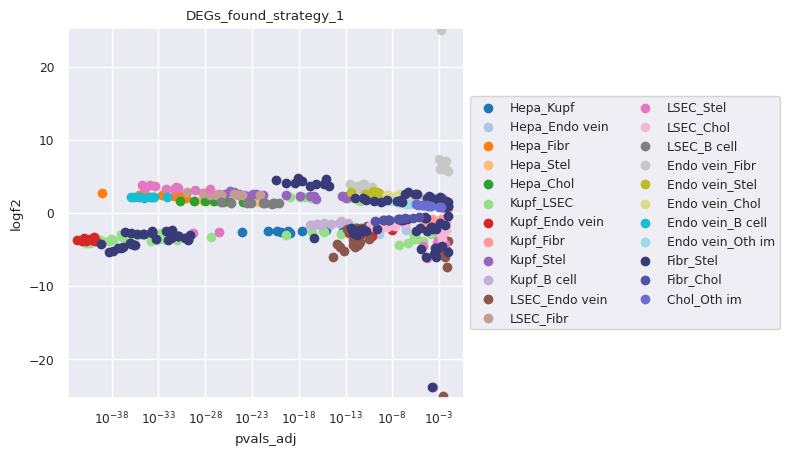

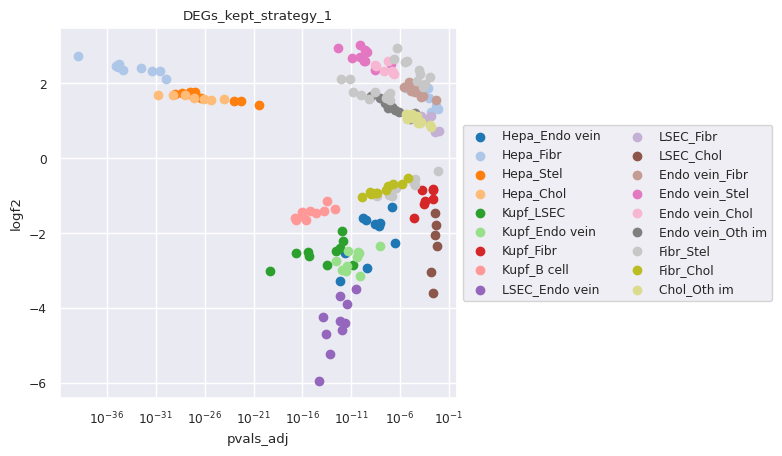

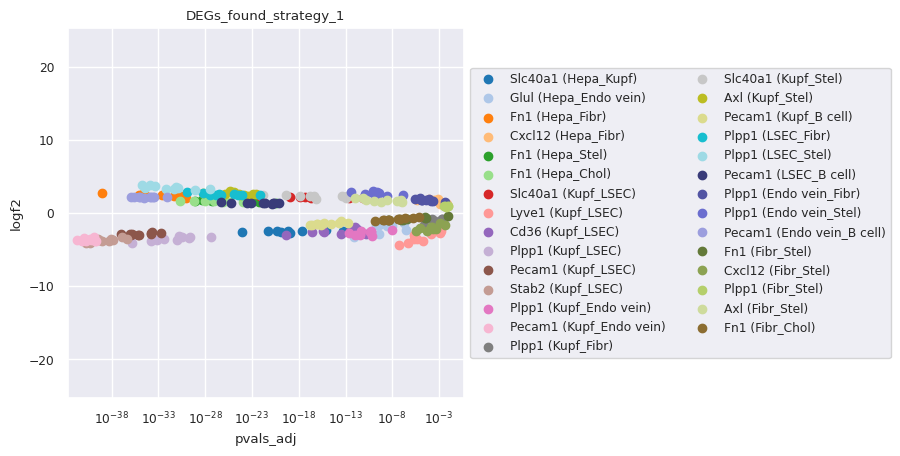

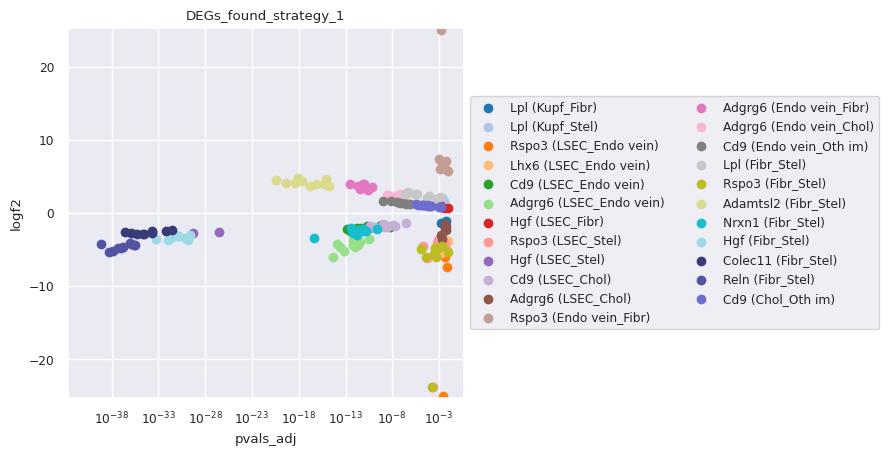

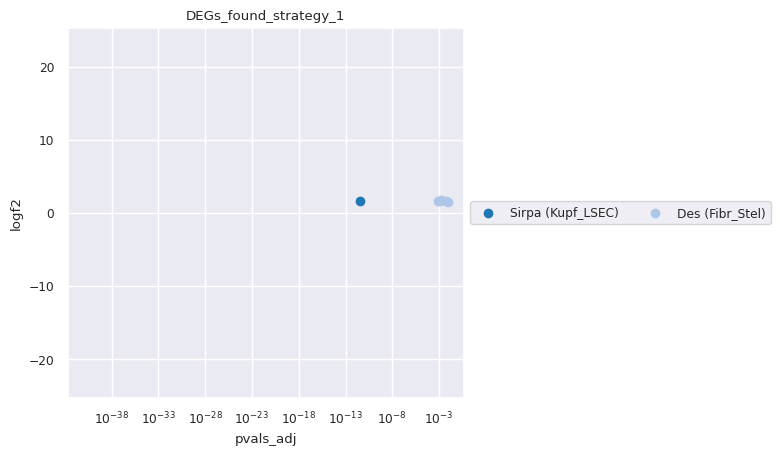

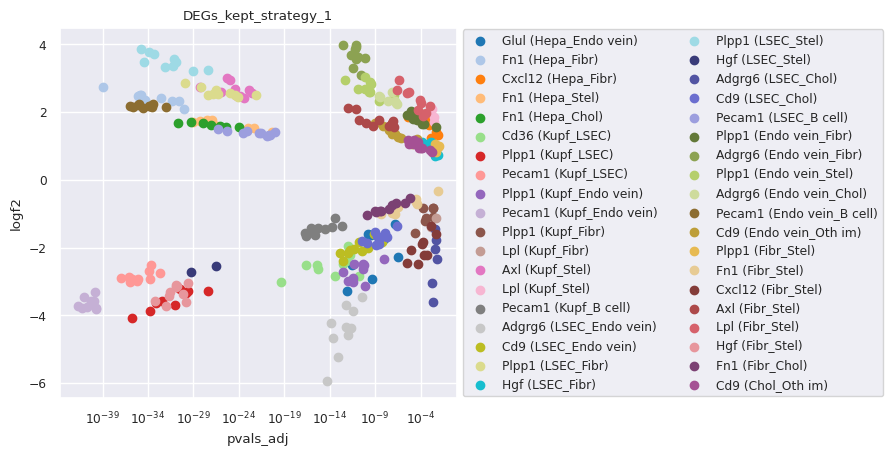

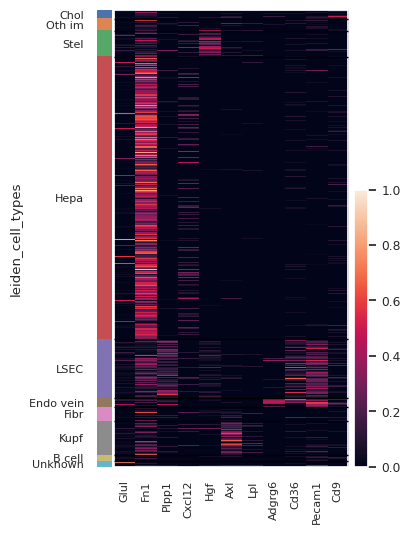

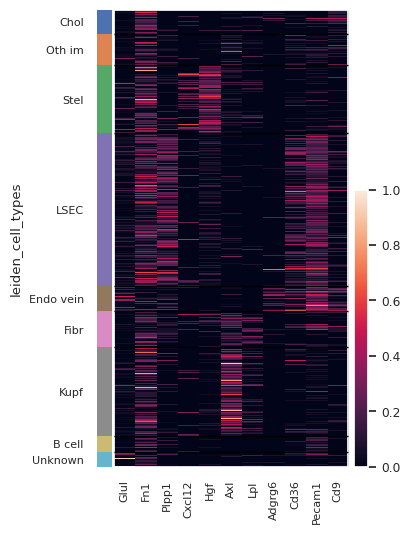

In [21]:
# STRATEGY 1 to change the marker gene list
results_strat1_10, results_runs1_10, DEG_details_runs1_10 = Apply_strategy_multiple_times(sdata.table,cell_types,leiden_clusters_per_ct,path_mg,10,1)

In [22]:
# Update marker gene list based on STRATEGY 1:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_modified1.csv")

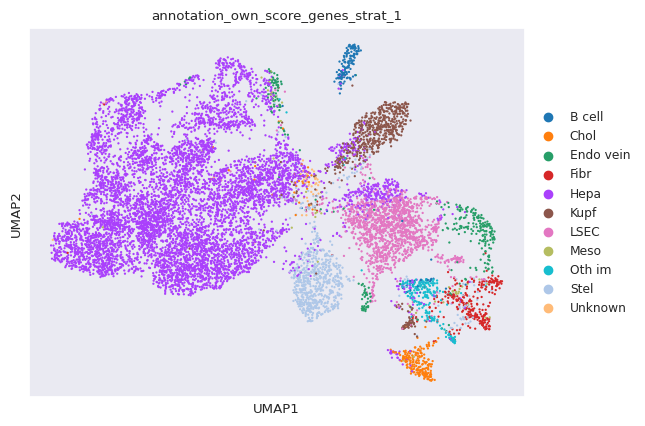

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_1
B cell                               1.549697
Chol                                 2.155326
Endo vein                            2.760955
Fibr                                 2.475953
Hepa                                63.876024
Kupf                                 5.619879
LSEC                                12.504453
Meso                                 0.525472
Oth im                               1.834699
Stel                                 6.359102
Unknown                              0.338440


In [23]:
# Own score genes with modified marker gene list based on STRATREGY 1
path_mg_mod1 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_modified1.csv"
scores = own_score_genes(sdata.table,path_mg_mod1,suffix='_strat_1')
visualize_classification(sdata,'annotation_own_score_genes_strat_1','umap_23_15',path_mg_mod1,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

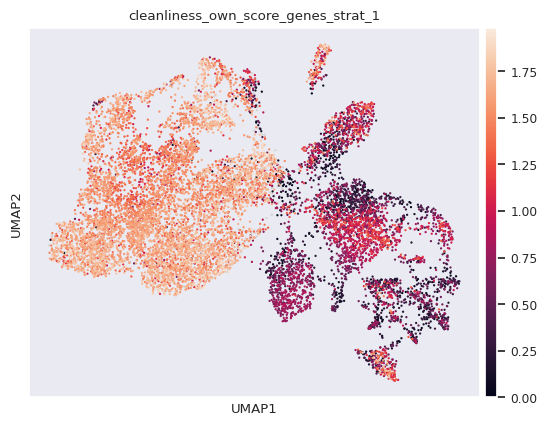

In [24]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_1'])

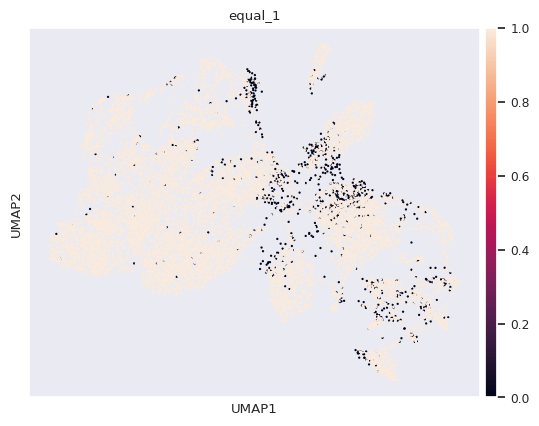

In [25]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_1'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_1'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_1'])

Hepa          8.002
LSEC          8.833
Endo vein     7.250
Chol          6.000
Kupf         18.000
Stel         13.501
Fibr         14.625
B cell        4.500
Meso          6.000
Oth im        3.000
dtype: float64


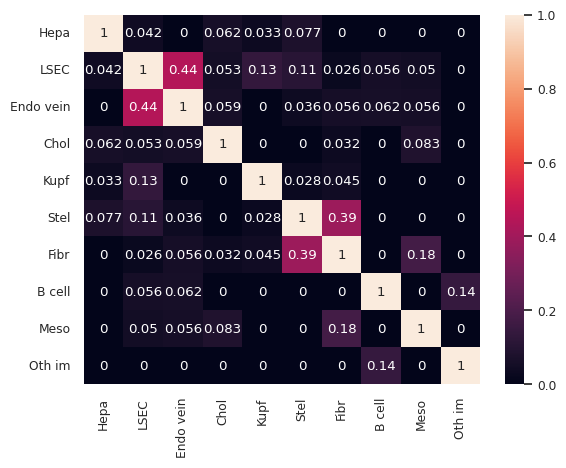

In [26]:
Jaccard_similarity_matrix(path_mg_mod1)

149
Ccr2
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Cd36
Is marker gene of: ['LSEC', 'Kupf']
Could also be a marker gene of: ['Endo vein']
Cd3e
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Clec10a
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Clec9a
Is marker gene of: []
Could also be a marker gene of: ['Kupf', 'LSEC']
Cx3cr1
Is marker gene of: []
Could also be a marker gene of: ['Chol']
Cyp2e1
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['Kupf', 'LSEC', 'Stel']
Dpt
Is marker gene of: ['Fibr']
Could also be a marker gene of: ['Chol']
Gdf15
Is marker gene of: ['Kupf']
Could also be a marker gene of: ['Hepa', 'LSEC']
Ghr
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['LSEC', 'Stel']
Glul
Is marker gene of: ['Hepa', 'Endo vein']
Could also be a marker gene of: ['LSEC']
Hal
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['Stel']
Mmp12
Is marker gene of: []
Could also be a marker gene of:

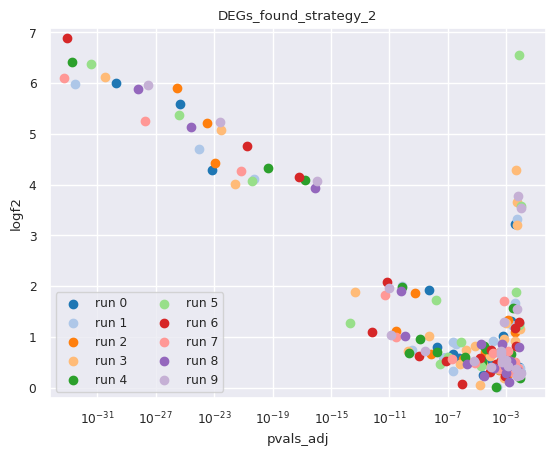

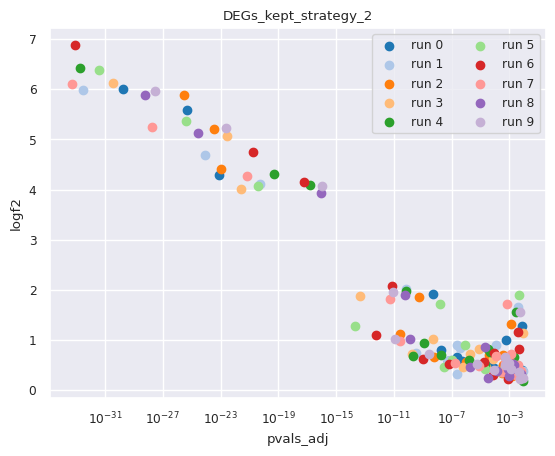

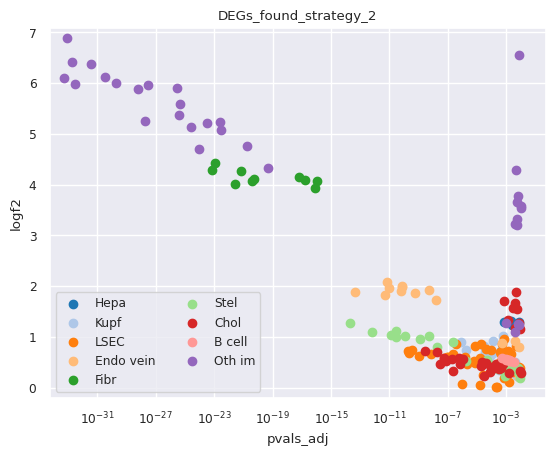

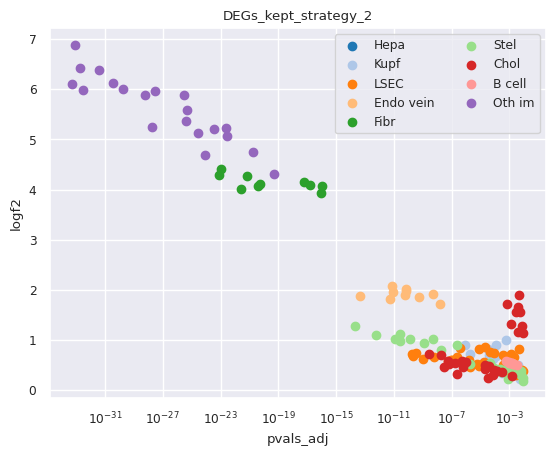

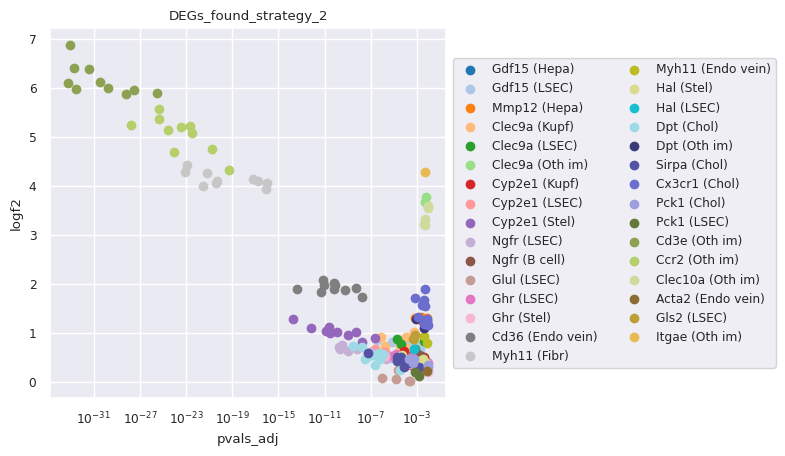

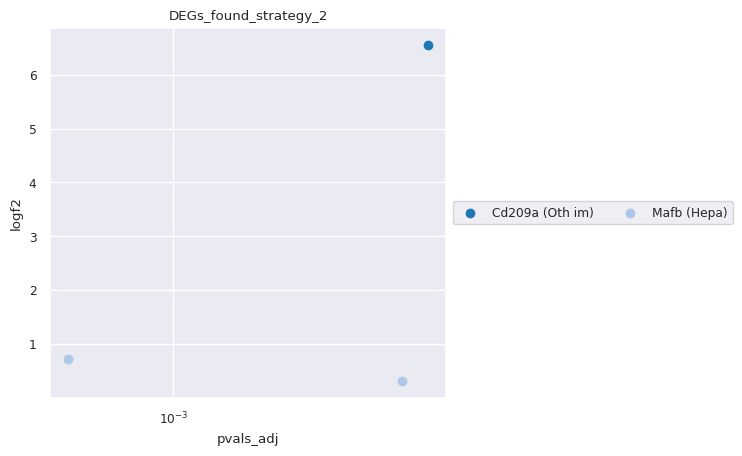

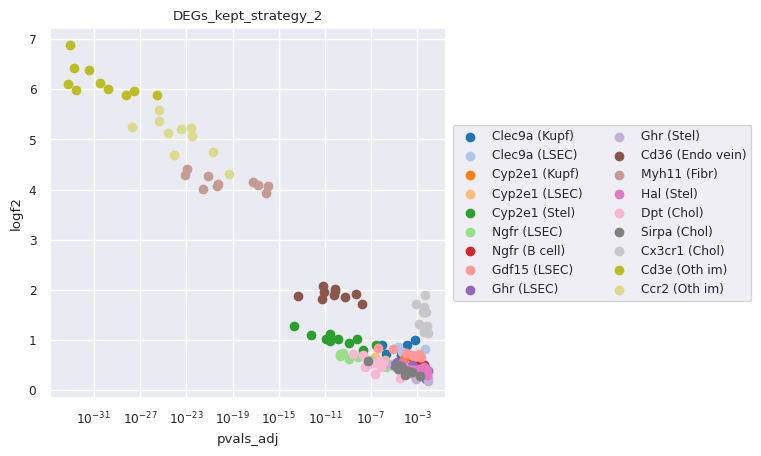

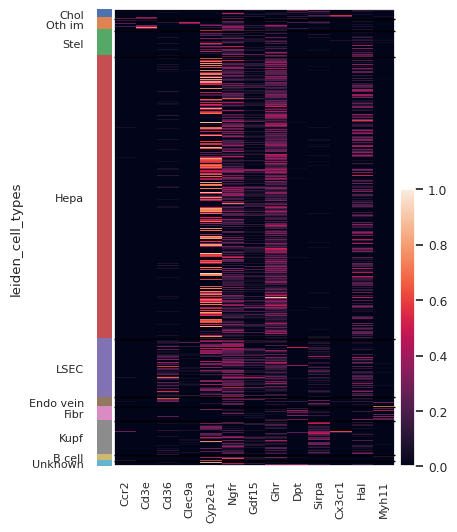

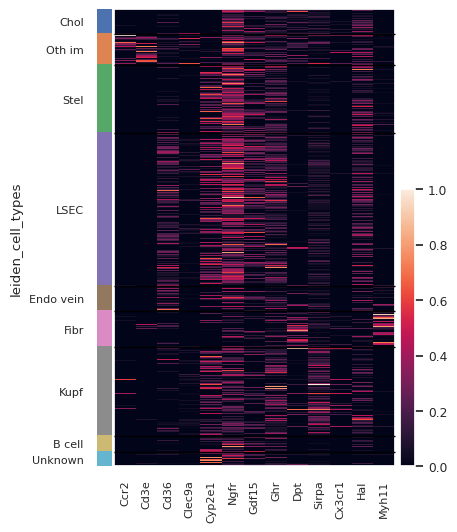

In [27]:
# STRATEGY 2 to change the marker gene list
results_strat2_10, results_runs2_10, DEG_details_runs2_10 = Apply_strategy_multiple_times(sdata.table,cell_types,leiden_clusters_per_ct,path_mg,10,2)

In [28]:
# Update marker gene list based on STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_modified2.csv")

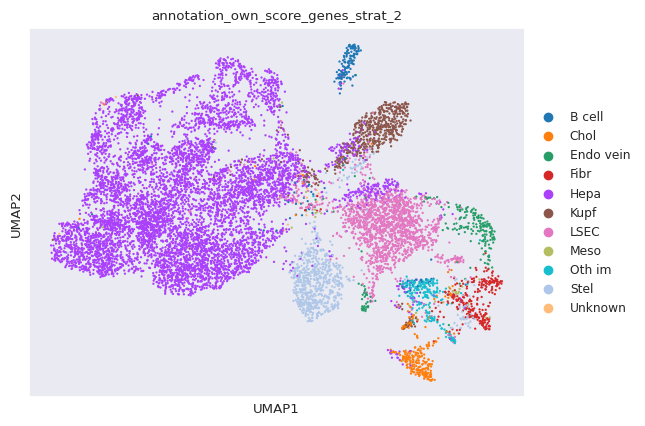

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_2
B cell                               1.834699
Chol                                 2.529391
Endo vein                            2.048450
Fibr                                 2.440328
Hepa                                63.012113
Kupf                                 5.272533
LSEC                                14.285714
Meso                                 0.365159
Oth im                               1.950481
Stel                                 6.136445
Unknown                              0.124688


In [29]:
# Own score genes with modified marker gene list based on STRATREGY 2
path_mg_mod2 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_modified2.csv"
scores = own_score_genes(sdata.table,path_mg_mod2,suffix='_strat_2')
visualize_classification(sdata,'annotation_own_score_genes_strat_2','umap_23_15',path_mg_mod2,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

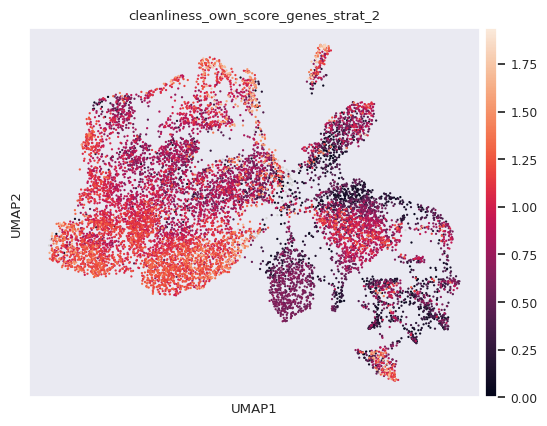

In [30]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_2'])
# makes sense that this becomes worse, because more marker genes overlap between cell types
# but does not mean that the annotation is worse

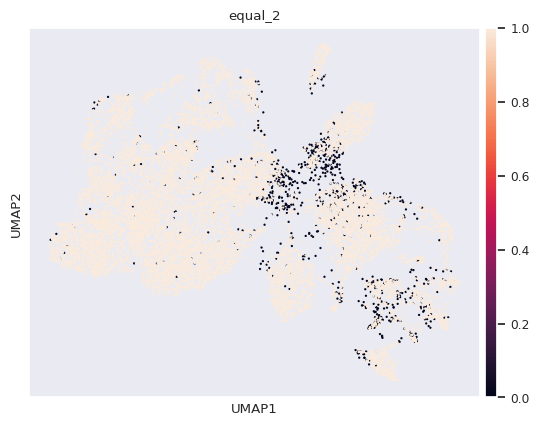

In [31]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_2'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_2'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_2'])

Hepa          8.669
LSEC         14.333
Endo vein     8.250
Chol         10.500
Kupf         21.500
Stel         19.001
Fibr         18.625
B cell        5.500
Meso          6.000
Oth im        6.000
dtype: float64


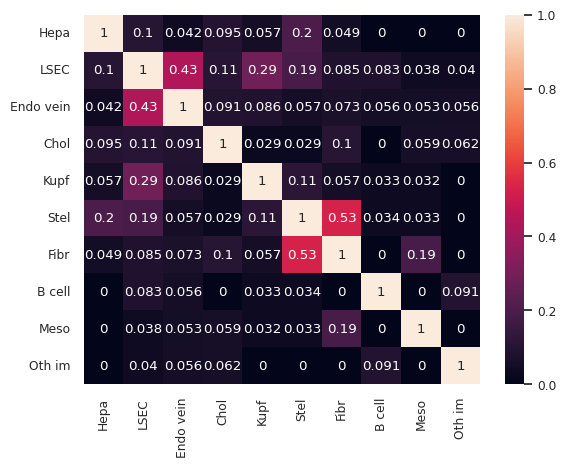

In [32]:
Jaccard_similarity_matrix(path_mg_mod2)

In [33]:
# STRATEGY 1 and STRATEGY 2 combined to change the marker gene list

In [34]:
# Update marker gene list based on STRATEGY 1 and STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_modified_1_2.csv")

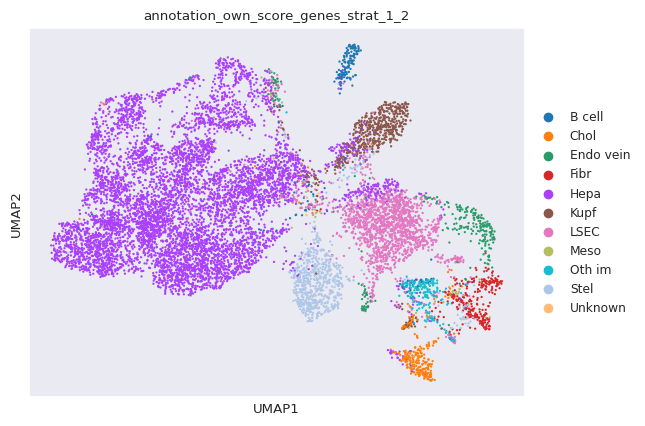

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_1_2
B cell                                 1.825793
Chol                                   2.502672
Endo vein                              2.458140
Fibr                                   2.458140
Hepa                                  62.566797
Kupf                                   5.308158
LSEC                                  14.481653
Meso                                   0.454222
Oth im                                 1.834699
Stel                                   6.056288
Unknown                                0.053438


In [35]:
# Own score genes with modified marker gene list based on STRATREGY 1 and STRATEGY 2
path_mg_mod_1_2 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_othIm_modified_1_2.csv"
scores = own_score_genes(sdata.table,path_mg_mod_1_2,suffix='_strat_1_2')
visualize_classification(sdata,'annotation_own_score_genes_strat_1_2','umap_23_15',path_mg_mod_1_2,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

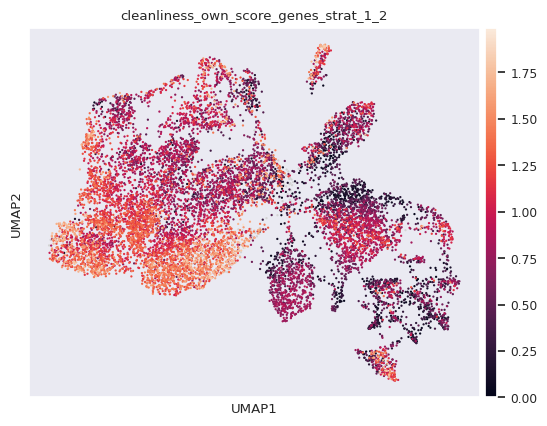

In [36]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_1_2'])

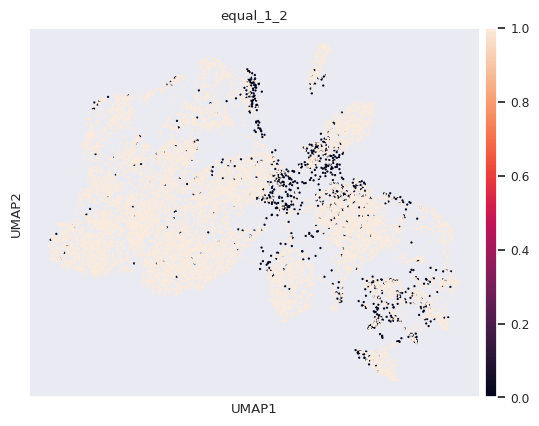

In [37]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_1_2'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_1_2'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_1_2'])

Hepa          8.002
LSEC         13.833
Endo vein     8.250
Chol          9.000
Kupf         20.000
Stel         16.501
Fibr         15.625
B cell        5.500
Meso          6.000
Oth im        5.000
dtype: float64


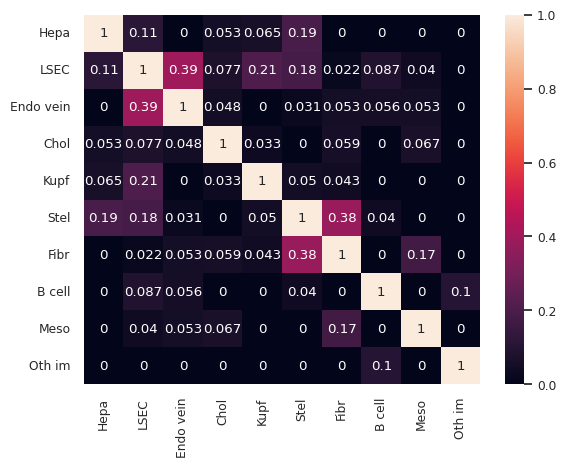

In [38]:
Jaccard_similarity_matrix(path_mg_mod_1_2)

Hepa         0.625668
LSEC         0.144817
Stel         0.060563
Kupf         0.053082
Chol         0.025027
Endo vein    0.024581
Fibr         0.024581
Oth im       0.018347
B cell       0.018258
Meso         0.004542
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64


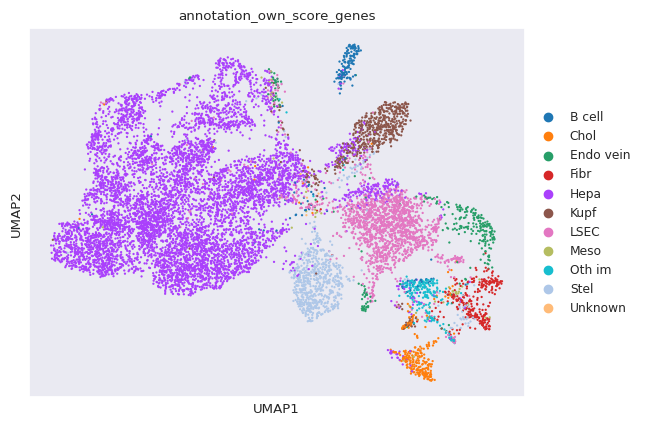

number of cells of each cell type to calculate the mean expression in this iteration: 51


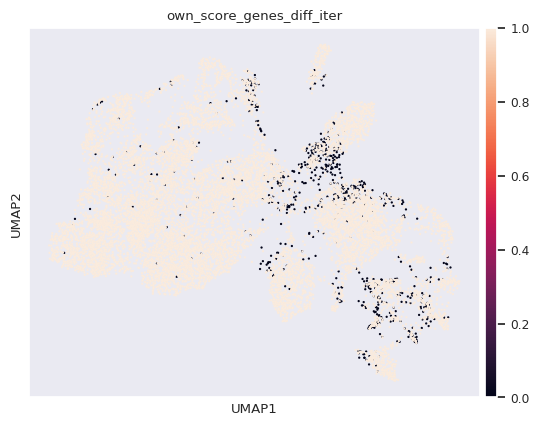

0.06002850017812612


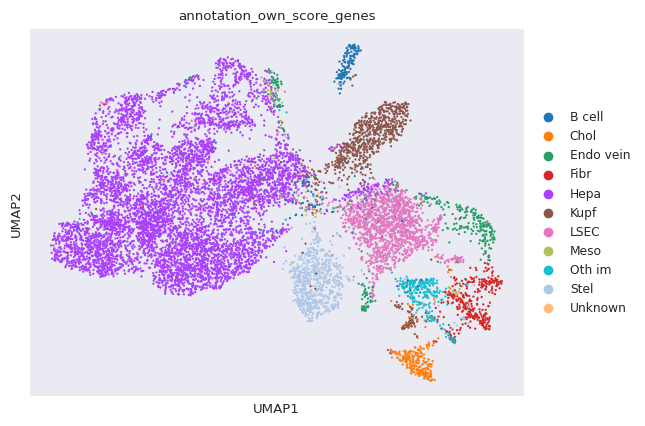

Hepa         0.600998
LSEC         0.132437
Kupf         0.072586
Stel         0.058693
Endo vein    0.031350
Fibr         0.030103
Oth im       0.023691
Chol         0.023335
B cell       0.020306
Meso         0.005967
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 67


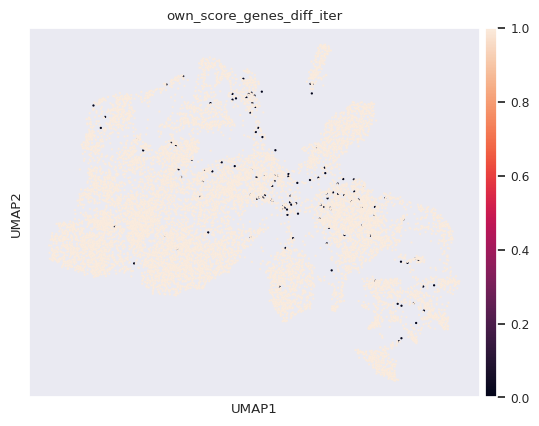

0.0110438190238689


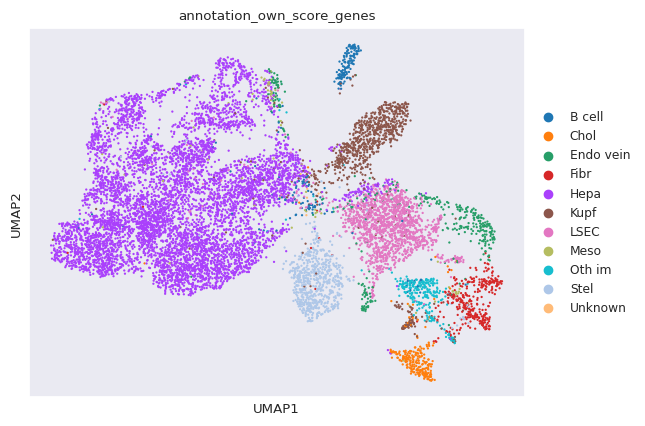

Hepa         0.597702
LSEC         0.128251
Kupf         0.075882
Stel         0.057713
Endo vein    0.032686
Fibr         0.030816
Oth im       0.023780
B cell       0.022978
Chol         0.022889
Meso         0.006769
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 76


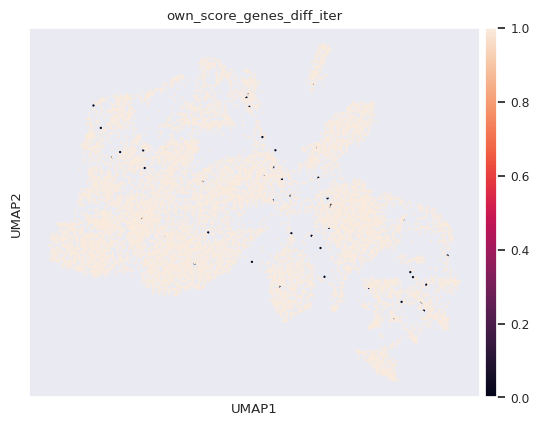

0.004007837548984681


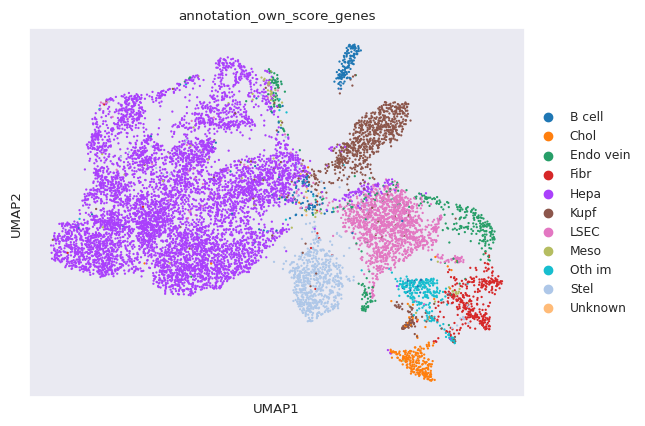

Hepa         0.597791
LSEC         0.127627
Kupf         0.074724
Stel         0.058960
Endo vein    0.032241
Fibr         0.031617
Oth im       0.023513
B cell       0.023335
Chol         0.022889
Meso         0.006769
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 76


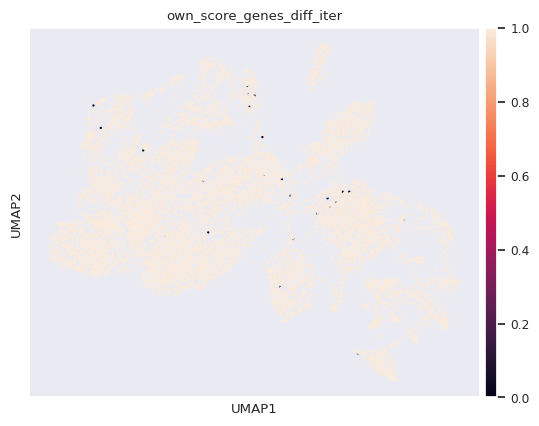

0.0021375133594584966


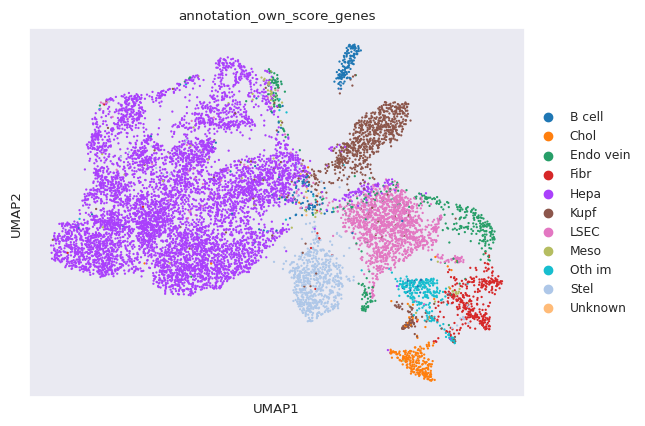

Hepa         0.596901
LSEC         0.127538
Kupf         0.075169
Stel         0.058693
Endo vein    0.033221
Fibr         0.031706
Oth im       0.023513
B cell       0.022978
Chol         0.022978
Meso         0.006769
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 76


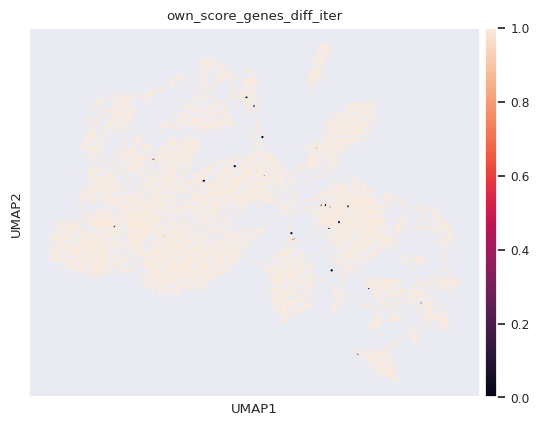

0.0020484503028143928


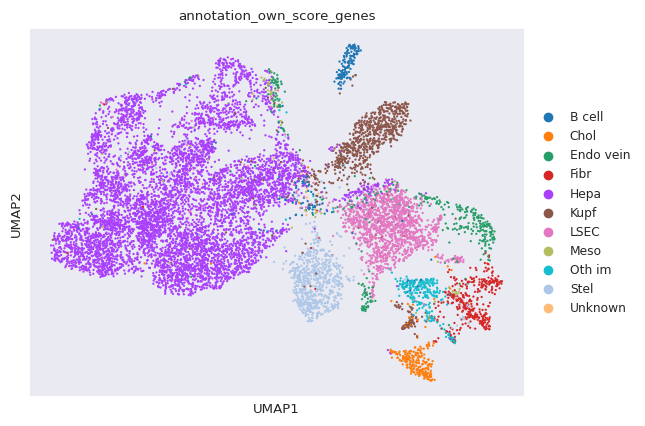

Hepa         0.597168
LSEC         0.126648
Kupf         0.075525
Stel         0.059227
Endo vein    0.033488
Fibr         0.031439
Oth im       0.023513
Chol         0.022889
B cell       0.022622
Meso         0.006947
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 78


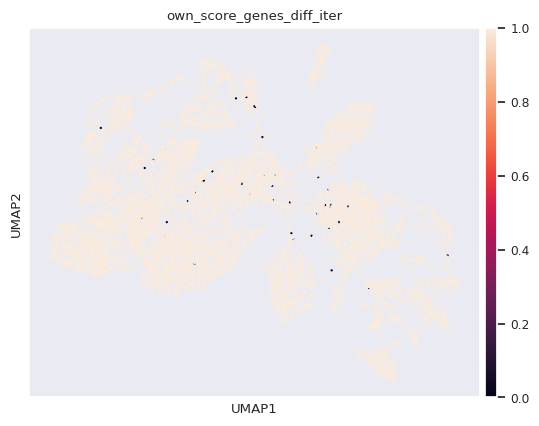

0.003651585322408265


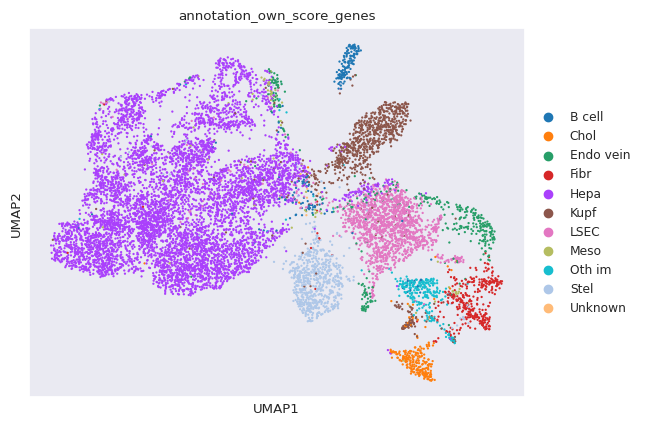

Hepa         0.597079
LSEC         0.128785
Kupf         0.075169
Stel         0.058158
Endo vein    0.033577
Fibr         0.031528
Oth im       0.023513
Chol         0.022800
B cell       0.022088
Meso         0.006769
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 76


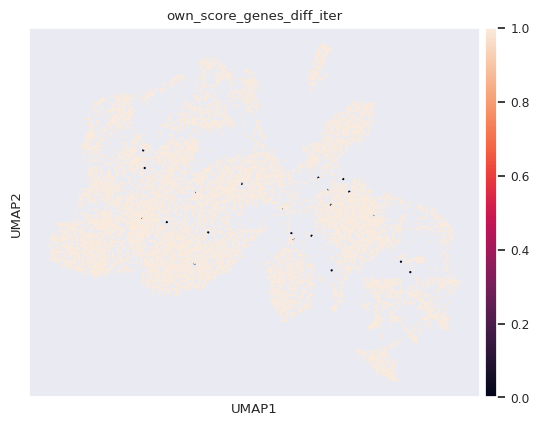

0.0019593872461702885


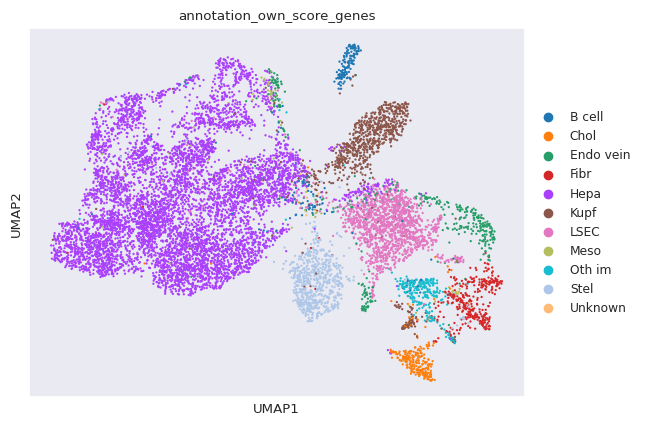

Hepa         0.597435
LSEC         0.128607
Kupf         0.074724
Stel         0.058871
Endo vein    0.033577
Fibr         0.031261
Oth im       0.023424
Chol         0.022978
B cell       0.021910
Meso         0.006680
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64
number of cells of each cell type to calculate the mean expression in this iteration: 75


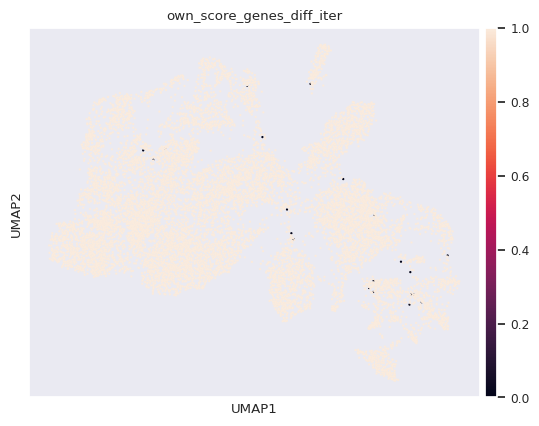

0.0018703241895261845


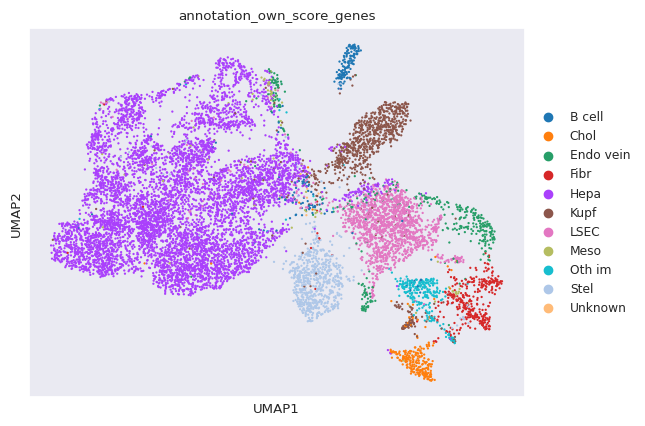

Hepa         0.597168
LSEC         0.128518
Kupf         0.074902
Stel         0.059049
Endo vein    0.033131
Fibr         0.031974
Oth im       0.023602
Chol         0.022978
B cell       0.021375
Meso         0.006769
Unknown      0.000534
Name: annotation_own_score_genes, dtype: float64


[0.06002850017812612,
 0.0110438190238689,
 0.004007837548984681,
 0.0021375133594584966,
 0.0020484503028143928,
 0.003651585322408265,
 0.0019593872461702885,
 0.0018703241895261845]

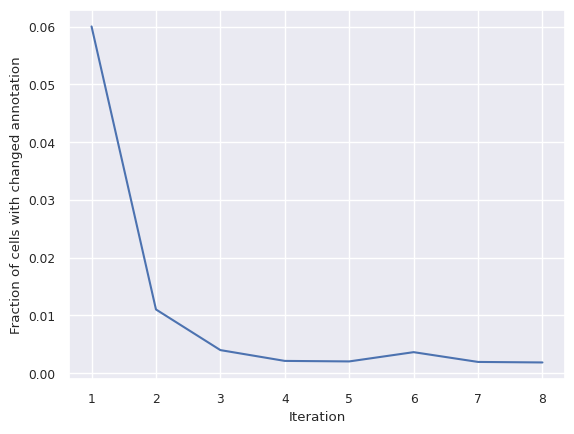

In [47]:
# Own score genes iterative with basic marker gene list updated with strategy 1 and 2
own_score_genes_iterative(sdata.table,path_mg_mod_1_2,nr_iterations=8)